<a href="https://colab.research.google.com/github/nandinisitlani2/ML-Projects/blob/main/Object_Recognition.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# end to end dog breed classification
This notebook builds an end to end multiclass image classifier using tenserflow2.0 and Tenserflow hub

** 1 Problem**

Identify breed of a dog from an uploaded picture

**2 Data **
The dataset is taken from kaggle:https://www.kaggle.com/c/dog-breed-identification/data

**3 Evaluation**
Evaluation is a file with prediction probablity for each dog breed for each image

**4 Features**

data:
Unstructured data hence we will use unstructered data
There are 120 dog breeds hence its a multilevel classification
Train set 10,000 plus images which are labelled 
Test set 10,000 plus images which we have to predict
 

In [1]:
import tensorflow as tf
print(tf.__version__)

2.11.0


In [2]:
# import necessary tools

import tensorflow_hub as hub
# check for gpu avialablity


In [3]:
## Getting the data ready converting into tensors (numerical represenatation)


In [4]:
import pandas as pd

In [5]:
labels_csv=pd.read_csv("drive/MyDrive/Object-Recognition/labels.csv")

In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [7]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: >

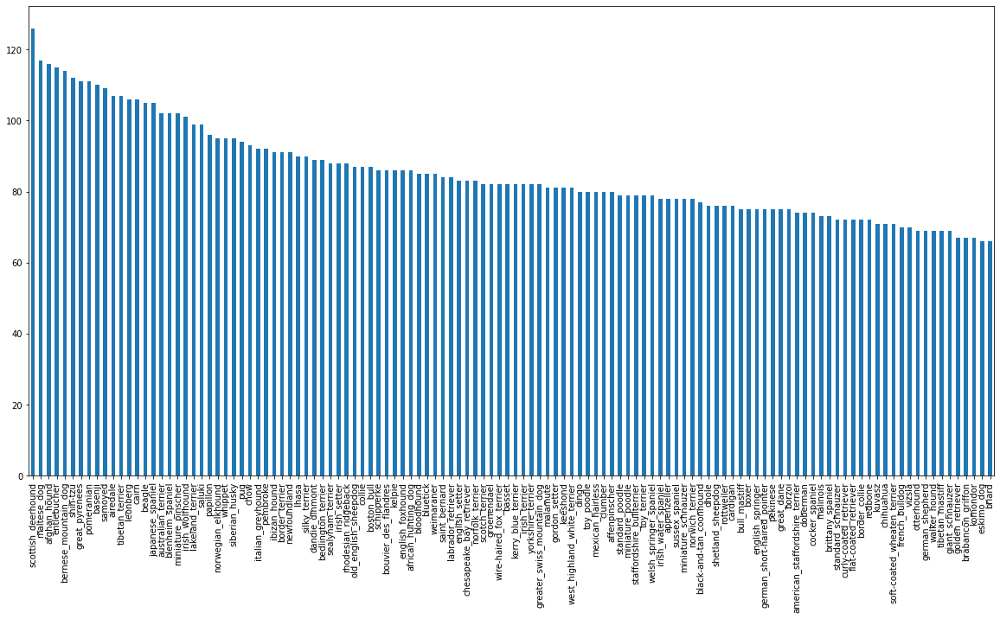

In [8]:
# images per breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [9]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

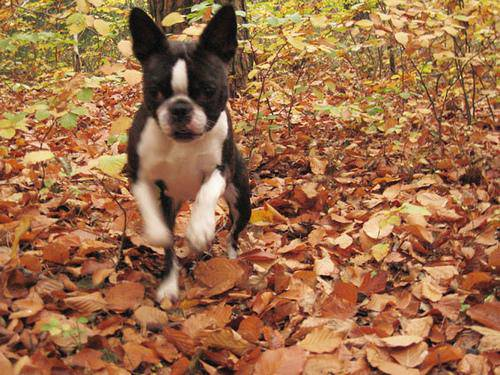

In [10]:
# viewing image in the notebook

from IPython.display import Image
Image("drive/MyDrive/Object-Recognition/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

Getting images and there labels



In [11]:
filename=["drive/MyDrive/Object-Recognition/train/"+ fname for fname in labels_csv["id"] +".jpg"]

In [12]:
filename[:10]

['drive/MyDrive/Object-Recognition/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Object-Recognition/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Object-Recognition/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Object-Recognition/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Object-Recognition/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Object-Recognition/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Object-Recognition/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Object-Recognition/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Object-Recognition/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Object-Recognition/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [13]:
# check whether no of file names = no of actual files
import os
if len(os.listdir("drive/MyDrive/Object-Recognition/train/"))==len(filename):
  print("filename match actual no of files")
else:
  print("check again")

filename match actual no of files


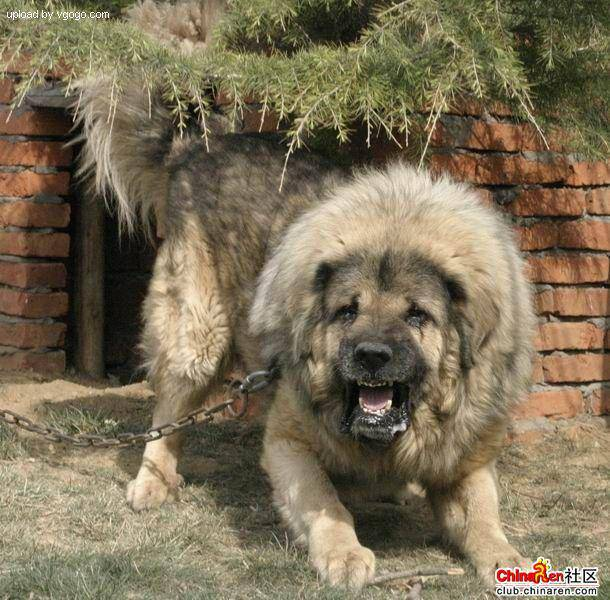

In [14]:
Image(filename[9000])

In [15]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [16]:
# preparing labels

In [17]:
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


In [18]:
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [19]:
len(labels)

10222

In [20]:
# check if no of labels matches filenames

if len(labels)==len(filename):
  print("match!")
else:
  print("check again")

match!


In [21]:
unique_breeds=(np.unique(labels))
len(unique_breeds)

120

In [22]:
## turning every label into an array of
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [23]:
boolean_label=[label==unique_breeds for label in labels]
boolean_label[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [24]:
# example turning boolean_arr into integers

In [25]:
print([labels])
print(np.where(labels[0]==unique_breeds))
print(boolean_label[0].argmax())
print(boolean_label[0].astype(int))

[array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)]
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [26]:
### creating a validation set since the imported data dosent have a predifined valifation set

In [27]:
X=filename
Y=boolean_label
len(X)

10222

In [28]:
# set no of images to use for experimenting

In [29]:
NUM_IMAGES=1000 #@param{type:"slider",min:1000,max:10000,step:1000}

In [30]:
from sklearn.model_selection import train_test_split
x_train,x_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],Y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [31]:
len(x_train),len(x_val)

(800, 200)

In [32]:
x_train[1]
x_val[1]

'drive/MyDrive/Object-Recognition/train/12405b2e93417d81f5308769c4e184c7.jpg'

In [33]:
y_val[1]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

# Preprocessing images:
Converting into tensors

# writing a function which ~
1. takes image file path as input
2. use tensor to read file and save as variable
3. turn image into Tensors
4. Normalize image from 0 to 225 to 0 to 1
5. Resize image to be shape of (224,224)
6. return a modified image


In [34]:
from matplotlib.pyplot import imread
image =imread(filename[44])
image.shape

(333, 500, 3)

In [35]:
image

array([[[ 79,  81,  60],
        [ 87,  88,  70],
        [ 98,  99,  81],
        ...,
        [221, 219, 222],
        [217, 215, 218],
        [216, 214, 217]],

       [[ 83,  84,  66],
        [ 89,  90,  72],
        [ 98,  99,  81],
        ...,
        [220, 218, 221],
        [216, 214, 217],
        [214, 212, 215]],

       [[ 89,  90,  72],
        [ 93,  94,  76],
        [100, 101,  85],
        ...,
        [218, 216, 219],
        [214, 212, 215],
        [213, 211, 214]],

       ...,

       [[210, 212, 198],
        [166, 168, 154],
        [101, 103,  90],
        ...,
        [197, 195, 200],
        [192, 190, 195],
        [192, 190, 195]],

       [[181, 184, 165],
        [189, 192, 173],
        [159, 161, 147],
        ...,
        [199, 197, 200],
        [192, 190, 193],
        [195, 193, 196]],

       [[172, 176, 153],
        [192, 195, 174],
        [184, 187, 168],
        ...,
        [192, 190, 193],
        [183, 181, 184],
        [189, 187, 190]]

In [36]:
image.max(),image.min()
# these are rgb value combination

(255, 0)

In [37]:
# converts anyting into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[ 79,  81,  60],
        [ 87,  88,  70],
        [ 98,  99,  81],
        ...,
        [221, 219, 222],
        [217, 215, 218],
        [216, 214, 217]],

       [[ 83,  84,  66],
        [ 89,  90,  72],
        [ 98,  99,  81],
        ...,
        [220, 218, 221],
        [216, 214, 217],
        [214, 212, 215]]], dtype=uint8)>

In [38]:
IMAGE_SIZE=224
def preprocess_image(imagepath,IMAGE_SIZE=IMAGE_SIZE):
  #reading the image
  image=tf.io.read_file(imagepath)
  # converting into tensors
  image=tf.io.decode_jpeg(image,channels=3)
  # normalising color range from 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)
  # resizing image
  image =tf.image.resize(image,size=[IMAGE_SIZE,IMAGE_SIZE])
  
  return image


# Turning data into batches
- deviding data into batches (32-testing 32 images at one time),since 10,000 images may not fit into memory
- We need our data in tensor tuples like (image,label)


In [39]:
def get_image_label(imagepath,label):
  image=preprocess_image(imagepath)
  return image,label


In [40]:
# trial
(preprocess_image(X[42]),tf.constant(Y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

# Function to turn data into batches

In [41]:
from tensorflow.python.data.ops.from_tensor_slices_op import from_tensor_slices
BATCH_SIZE=32
def create_batches(X,Y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  if test_data:
    print("Creating test batches")
    # this line forms a dataset from the data slices,.constant converts x into tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(preprocess_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("creating valid batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("creating train data")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    # shuffling data
    data=data.shuffle(buffer_size=len(X))
    data=data.map(get_image_label)
    data_batch=data.batch(BATCH_SIZE)
  return data_batch


In [42]:
# creating training and validation data batches


In [43]:
train_data=create_batches(x_train,y_train)
val_data=create_batches(x_val,y_val,valid_data=True)

creating train data
creating valid batches


In [44]:
# checking attributes of data batches

In [45]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [46]:
#these are tuples of image and labels(batch ,dimension)

## Visualising Data batches for better clarity

In [47]:
import matplotlib.pyplot as plt
def plot_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[boolean_label[i].argmax()])
    plt.axis("off")

In [48]:
labels[0]

'boston_bull'

In [49]:
train_images,train_labels=next(train_data.as_numpy_iterator())
# as numpy iterator opens and seprates the train_data_batch and next brings the first batch
train_images,train_labels

(array([[[[4.46507841e-01, 2.70037234e-01, 1.15467437e-01],
          [4.06514049e-01, 2.22244069e-01, 6.96603730e-02],
          [4.69093770e-01, 2.92835593e-01, 1.36726812e-01],
          ...,
          [1.12387471e-01, 9.04335976e-02, 3.36409807e-02],
          [1.15660682e-01, 8.88049677e-02, 2.24228040e-03],
          [1.18916646e-01, 9.53872278e-02, 0.00000000e+00]],
 
         [[4.71621901e-01, 3.03048342e-01, 1.35795191e-01],
          [4.54926163e-01, 2.86372930e-01, 1.18209407e-01],
          [5.55912197e-01, 3.87416035e-01, 2.18525961e-01],
          ...,
          [1.75388753e-01, 1.53427854e-01, 9.66387540e-02],
          [1.62674949e-01, 1.35186836e-01, 3.15582491e-02],
          [1.35951281e-01, 1.08500317e-01, 1.85231474e-04]],
 
         [[5.09422302e-01, 3.55344355e-01, 1.60333827e-01],
          [5.14124691e-01, 3.62491280e-01, 1.66570395e-01],
          [5.92043161e-01, 4.43458289e-01, 2.43239433e-01],
          ...,
          [1.90995619e-01, 1.68411523e-01, 1.0699

In [50]:
len(train_images)

32

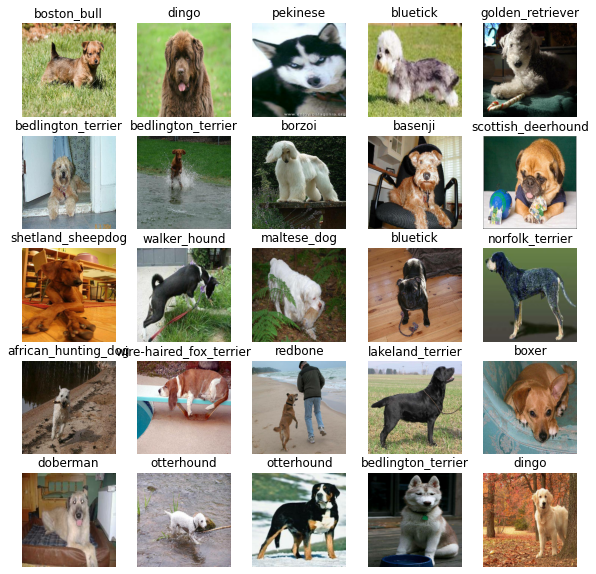

In [51]:
plot_25_images(train_images,train_labels)

In [52]:
# visulaising validation set
val_images,val_labels=next(val_data.as_numpy_iterator())


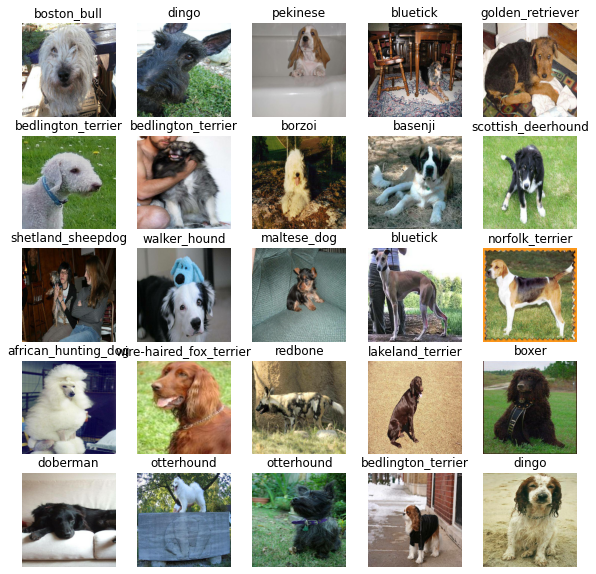

In [53]:
plot_25_images(val_images,val_data)

# Building the model
3 things to define
- Input shape to our model
- output shape of our model
- url we want to use


In [54]:
INPUT=[None,IMAGE_SIZE,IMAGE_SIZE,3]
OUTPUT=len(unique_breeds)
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_050_224/classification/5"

In [55]:
# We will be using sequential keras api

In [56]:
def create_model(InputShape=INPUT,OutputShape=OUTPUT,Model_Url=MODEL_URL):
  print("building model with...",MODEL_URL)

  # setting up model layers
  model=tf.keras.Sequential([hub.KerasLayer(Model_Url),# Layer 1 input layer
                             tf.keras.layers.Dense(units=OUTPUT,activation="softmax")])# layer 2 output layer
                             # after using softmax each output is between 0-1 and they add to 1
                             # for binary classification we would have used sigmoid
  # compiling the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),# optimizer helps minimize loss based on the models action
      metrics=["accuracy"]


  )
  model.build(INPUT)

  return model


In [57]:
model=create_model()
model.summary()

building model with... https://tfhub.dev/google/imagenet/mobilenet_v2_050_224/classification/5


Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              1988505   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 2,108,745
Trainable params: 120,240
Non-trainable params: 1,988,505
_________________________________________________________________


In [58]:
# the non trainable parameters are which the model (modelnetv2 )has already trained on and learned patterns


# Creating callbacks

callbacks are helper function which we can call during a model is learning to do certain actions like stop training etc

steps:
- load tensorflow extention
- create a tensoboard callback which is able to able to save logs to a directory and save it to our models fit function
- visualize our models train logs


In [59]:
%load_ext tensorboard
import datetime
def create_tensorflow_callback():
  logdir=os.path.join("drive/MyDrive/Object-Recognition/Log",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)




# Early stopping callback



In [60]:
early_stopping_callback=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

# Training the model

In [61]:
NUM_EPOCH=100#@param{type:"slider",min:10,max:100,step:10}

In [62]:
# 100 epochs means our model is getting 100 chances to go through yhe dataset and figure out patterns

In [63]:
def train_model():

  model=create_model()

  tensorboard=create_tensorflow_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCH,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping_callback])
  return model

In [64]:
model=train_model()

building model with... https://tfhub.dev/google/imagenet/mobilenet_v2_050_224/classification/5
Epoch 1/100
25/25 [==============================] - 173s 6s/step - loss: 4.9008 - accuracy: 0.0613 - val_loss: 3.7700 - val_accuracy: 0.1800
Epoch 2/100
25/25 [==============================] - 3s 113ms/step - loss: 1.7710 - accuracy: 0.6025 - val_loss: 2.6426 - val_accuracy: 0.3850
Epoch 3/100
25/25 [==============================] - 3s 110ms/step - loss: 0.6750 - accuracy: 0.8988 - val_loss: 2.2857 - val_accuracy: 0.4150
Epoch 4/100
25/25 [==============================] - 4s 145ms/step - loss: 0.3051 - accuracy: 0.9800 - val_loss: 2.1815 - val_accuracy: 0.4400
Epoch 5/100
25/25 [==============================] - 3s 108ms/step - loss: 0.1723 - accuracy: 1.0000 - val_loss: 2.1524 - val_accuracy: 0.4650
Epoch 6/100
25/25 [==============================] - 3s 112ms/step - loss: 0.1151 - accuracy: 1.0000 - val_loss: 2.1313 - val_accuracy: 0.4700
Epoch 7/100
25/25 [=============================

In [65]:
# it stopped training due to early stop callback since accuracy was not increasing after 3 continous epochs

## model is overfitting

## Checking the tensorboard logs

In [66]:
## the %tensorboard function will access the logdir we created earlier and visualize its contents

In [67]:
%tensorboard --logdir drive/MyDrive/Object-Recognition/Log

<IPython.core.display.Javascript object>

## Making and evaluating predictions using the trained model

In [68]:
prediction=model.predict(val_data,verbose=1) # verbose=1 shows the progress of the predictions

7/7 [==============================] - 4s 76ms/step


In [69]:
prediction

array([[6.37627346e-03, 1.92485095e-04, 4.26464248e-05, ...,
        1.90673472e-05, 1.42807513e-03, 7.77639274e-04],
       [1.59624824e-03, 4.65329067e-05, 2.88431663e-02, ...,
        2.26091070e-04, 9.14253003e-04, 3.14419012e-04],
       [7.97319535e-06, 2.24376854e-04, 7.73815918e-06, ...,
        2.55799713e-03, 2.09710815e-05, 1.34395785e-03],
       ...,
       [3.24405141e-06, 2.98161875e-04, 1.54864043e-04, ...,
        3.48188842e-05, 1.46989987e-04, 1.14211143e-04],
       [8.32500082e-05, 6.53803945e-05, 5.74239095e-07, ...,
        2.89006457e-05, 6.27567317e-07, 1.17983975e-04],
       [2.07313860e-05, 2.88628889e-05, 1.20950994e-04, ...,
        5.70003130e-03, 1.13140210e-03, 1.89862349e-05]], dtype=float32)

In [70]:
# this is the probablity value for every (120) label for 200 images

In [71]:
np.sum(prediction[0])# beacuse we have used softmax earlier all predictions add up to 1

0.99999994

In [72]:
index=29
print(f"probality of prediction",np.max(prediction[index]))
print(f"max index",np.argmax(prediction[index]))
print(f"predicted label",unique_breeds[np.argmax(prediction[index])])

probality of prediction 0.7349848
max index 37
predicted label dingo


In [73]:
# function to return label from a prob arr
def get_label(prediction_prob):
  return unique_breeds[np.argmax(prediction_prob)]

In [74]:
get_label(prediction[3])

'standard_schnauzer'

In [75]:
images_=[]
labels_=[]
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [76]:
images_[0],labels_[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [77]:
def unbatichify(dataset):
  images_=[]
  labels_=[]
  for image,label in dataset.unbatch().as_numpy_iterator():
   images_.append(image)
   labels_.append(unique_breeds[np.argmax(label)])

  return images_,labels_

In [78]:
val_images,val_labels=unbatichify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [79]:
def plot_pred(prediction_prob,labels,images,n=1):
  pred_prob=prediction_prob[n]
  true_label=labels[n]
  image=images[n]

  pred_label=get_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{},{:2.0f}%,{}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                    color=color
                                              )
                                        



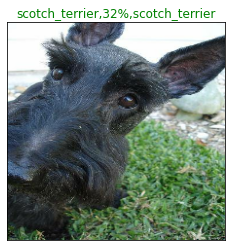

In [80]:
plot_pred(prediction_prob=prediction,
          labels=val_labels,
          images=val_images)

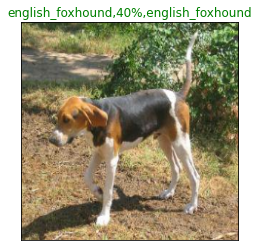

In [81]:
plot_pred(prediction_prob=prediction,
          labels=val_labels,
          images=val_images,
          n=42)

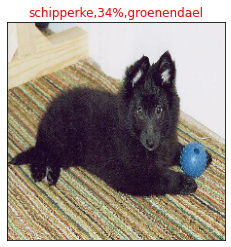

In [82]:
plot_pred(prediction_prob=prediction,
          labels=val_labels,
          images=val_images,
          n=77)

# Visualizing the predictions

In [86]:
def plot_pred_prob(prediction_prob,labels,n=1):
  prediction_prob,true_label=prediction[n],labels[n]

  # getting top 10 predictions

  top_10_prediction_prob_index=prediction_prob.argsort()[-10:][::-1]
  top_10_prediction_prob=prediction_prob[top_10_prediction_prob_index]
  # labels
  top_10_labels=unique_breeds[top_10_prediction_prob_index]

  top_plot=plt.bar(np.arange(len(top_10_labels)),
                   top_10_prediction_prob,
                   color='grey')
  
  plt.xticks(np.arange(len(top_10_labels)),
             labels=top_10_labels,
             rotation='vertical')
  
  if np.isin(true_label,top_10_labels):
    top_plot[np.argmax(top_10_labels==true_label)].set_color("green")
  else:
    pass


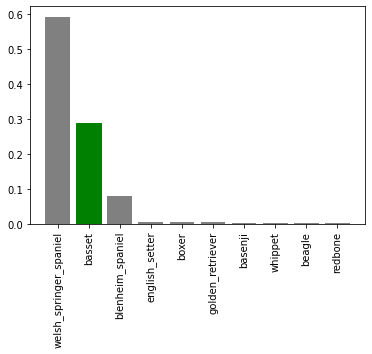

In [87]:
plot_pred_prob(prediction_prob=prediction,labels=val_labels,n=2)

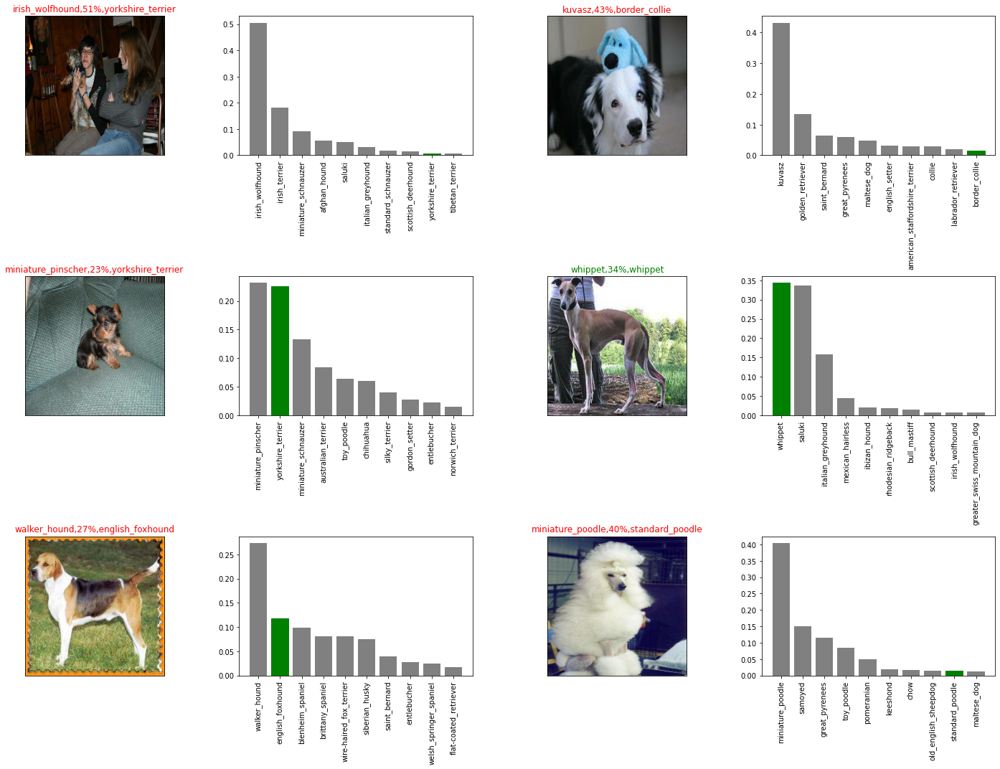

In [92]:

i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_prob=prediction,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_prob(prediction_prob=prediction,labels=val_labels,n=i+i_multiplier)
plt.tight_layout(h_pad=1)
plt.show()

# Confusion Matrix

In [93]:
from sklearn.metrics import confusion_matrix


In [113]:
len(val_labels)

200

In [108]:

def pred_label_arr(prediction):
  pred_arr=[]
  for i in range(len(prediction)):
    pred_arr.append(unique_breeds[np.argmax(prediction[i])])
  return pred_arr

In [96]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [109]:
pred_label_arr(prediction)

['old_english_sheepdog',
 'scotch_terrier',
 'welsh_springer_spaniel',
 'standard_schnauzer',
 'airedale',
 'bedlington_terrier',
 'malamute',
 'old_english_sheepdog',
 'saint_bernard',
 'collie',
 'irish_wolfhound',
 'kuvasz',
 'miniature_pinscher',
 'whippet',
 'walker_hound',
 'miniature_poodle',
 'irish_setter',
 'african_hunting_dog',
 'german_short-haired_pointer',
 'irish_water_spaniel',
 'bernese_mountain_dog',
 'malamute',
 'affenpinscher',
 'welsh_springer_spaniel',
 'welsh_springer_spaniel',
 'scottish_deerhound',
 'komondor',
 'miniature_schnauzer',
 'cardigan',
 'dingo',
 'dandie_dinmont',
 'walker_hound',
 'brittany_spaniel',
 'miniature_schnauzer',
 'malamute',
 'malamute',
 'welsh_springer_spaniel',
 'chesapeake_bay_retriever',
 'mexican_hairless',
 'labrador_retriever',
 'labrador_retriever',
 'lakeland_terrier',
 'english_foxhound',
 'collie',
 'miniature_poodle',
 'groenendael',
 'boston_bull',
 'miniature_poodle',
 'miniature_poodle',
 'chihuahua',
 'american_staffo

200

In [117]:
conf_matrix=confusion_matrix(val_labels,pred_label_arr(prediction))

In [116]:
from sklearn.metrics import  ConfusionMatrixDisplay


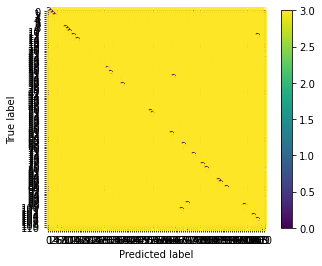

In [120]:
disp=ConfusionMatrixDisplay(conf_matrix)
disp.plot()
plt.show()

# Saving and loading a trained model